In [9]:
from essentia.standard import *
import librosa
import numpy as np
import IPython
from pylab import plot, show, figure, imshow
%matplotlib inline
import matplotlib.pyplot as plt
import soundfile as sf


In [ ]:
print(dir(essentia.standard))
help(essentia.standard.MFCC)

### Audio Laden:
- AudioLoader (stereo) 
- MonoLoader (mono)
- EasyLoader (mono, normalisiert)
- EqloudLoader (mono, normalisiert, EqualLoudness Filter)

In [20]:
sr = 44100

file = '../AudioFiles/1.mp3'
audio = MonoLoader(filename=file, sampleRate=sr)()
# y, sr = librosa.load(file)

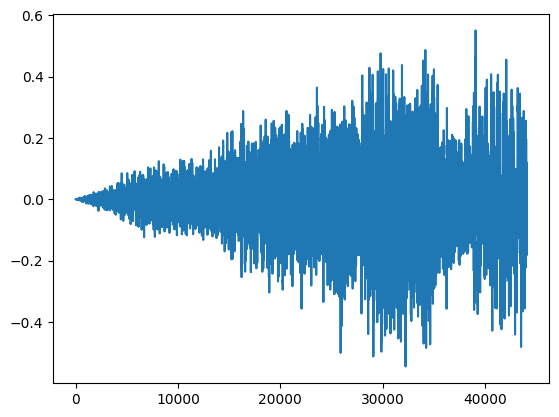

In [22]:
plot(audio[:sr])

### Data Augmentation

In [12]:
random = np.random.rand(len(audio),1).T.astype('f')

In [13]:
audio_rand = audio + random[0] * 0.1
sf.write('../AudioFiles/1_Random.wav', audio_rand, samplerate=sr)
IPython.display.Audio('../AudioFiles/1_Random.wav')

In [14]:
addNoise = NoiseAdder(level= -20)(audio)
sf.write('../AudioFiles/1_Random.wav', addNoise, samplerate=sr)
IPython.display.Audio('../AudioFiles/1_Random.wav')

In [15]:
re = Resample(inputSampleRate=44100, outputSampleRate=43000)(audio)
sf.write('../AudioFiles/Resample.wav', re, samplerate=sr)
IPython.display.Audio('../AudioFiles/Resample.wav')

In [19]:
audio_fast = librosa.effects.time_stretch(audio, rate=1.3)
sf.write('../AudioFiles/Resample.wav', audio_fast, samplerate=sr)
IPython.display.Audio('../AudioFiles/Resample.mp3')

#### Pytorch Data Augmentation

- https://pypi.org/project/torchaudio-augmentations/






### Spektrum berechnen

<img src="../Sonstiges/Bilder/FFT.png" align="left" width="450" />

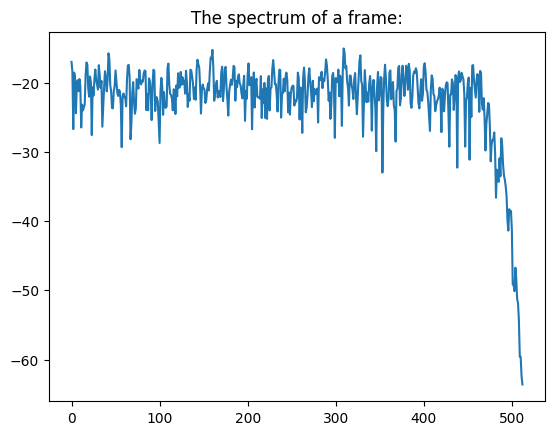

In [26]:
w = Windowing(type='hann')
spectrum = Spectrum()
amp2db = UnaryOperator(type='lin2db', scale=1)

frame = audio[0 :1024]
spec = amp2db(spectrum(w(frame)))

#spec = spectrum(w(frame))

plot(spec)
plt.title("The spectrum of a frame:")
show()


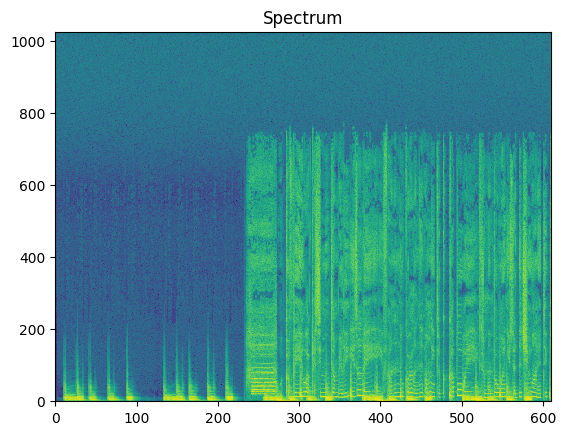

In [54]:
w = Windowing(type='hann')
spectrum = Spectrum()
amp2db = UnaryOperator(type='lin2db', scale=1)
pool = essentia.Pool()

frameSize=2048
hopSize=1024

# frequency resolution = frameSize/2

for frame in FrameGenerator(audio, frameSize=frameSize, hopSize=hopSize):
    spec = amp2db(spectrum(w(frame)))
    pool.add('spec', spec)

imshow(pool['spec'].T, aspect = 'auto', origin='lower', interpolation='none')
plt.title("Spectrum")
show()

### Mel-Spektrogram und Mel-Frequency Cepstral Coefficients (MFCCs)

#### Mel-Skala:
<img src="../Sonstiges/Bilder/Mel_Scale.png" align="left" width="450" />

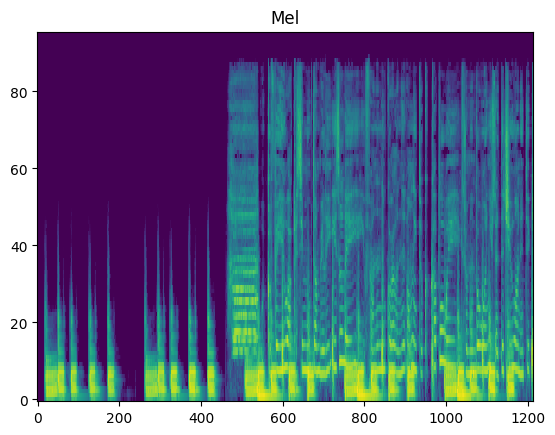

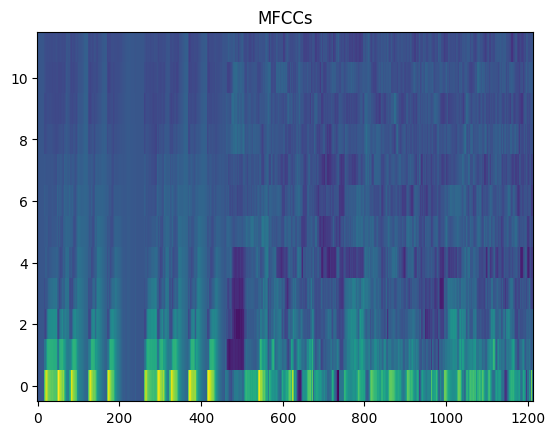

In [81]:
w = Windowing(type='hann')
spectrum = Spectrum()

mel = MelBands(numberBands=96)
mfcc = MFCC(numberBands=96, numberCoefficients=13)
logNorm = UnaryOperator(type='lin2db')

frameSize=2048
hopSize=512

pool.clear()


for frame in FrameGenerator(audio, frameSize=frameSize, hopSize=hopSize, startFromZero=True):
    spec = spectrum(w(frame))
    melspec = amp2db(mel(spec))
    bands, coeffs = mfcc(spec)

    pool.add('mel', melspec)
    pool.add('mfccs', coeffs)


imshow(pool['mel'].T, aspect = 'auto', origin='lower', interpolation='none')
plt.title("Mel")
show()

imshow(pool['mfccs'].T[1:,:], aspect = 'auto', origin='lower', interpolation='none')
plt.title("MFCCs")
show()

### Beispiel Librosa

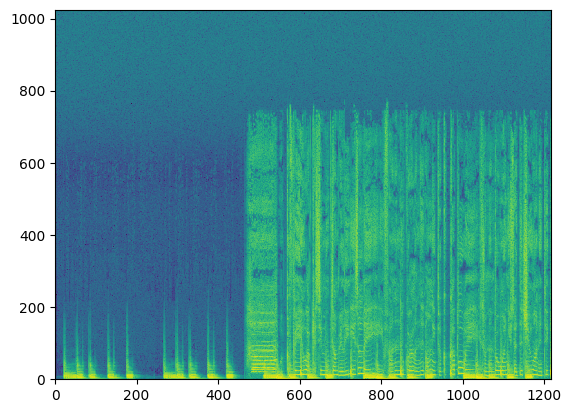

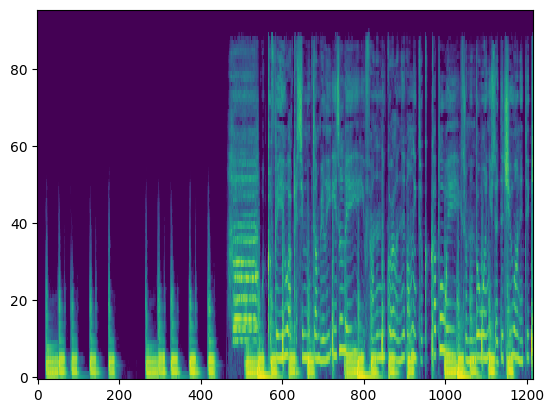

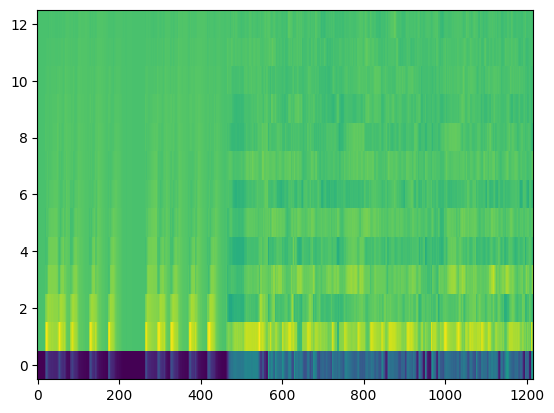

In [64]:
# spectrogram
spec_lib = librosa.power_to_db(np.abs(librosa.stft(audio, n_fft=frameSize, hop_length=hopSize, window='hann')))

# mel spectrogram
mel_lib = librosa.feature.melspectrogram(y=audio, n_fft=frameSize, hop_length=hopSize, sr=sr, n_mels=96)
mel_lib = librosa.power_to_db(mel_lib)

# mfccs
mfccs = librosa.feature.mfcc(y=audio, n_fft=frameSize, hop_length=hopSize, sr=sr, n_mfcc=13)


imshow(spec_lib, aspect = 'auto', origin='lower', interpolation='none')
show()

imshow(mel_lib, aspect = 'auto', origin='lower', interpolation='none')
show()

imshow(mfccs, aspect = 'auto', origin='lower', interpolation='none')
show()

### Lowlevel Features Beispiele

- Spectral Centroid
- Spectral Rolloff

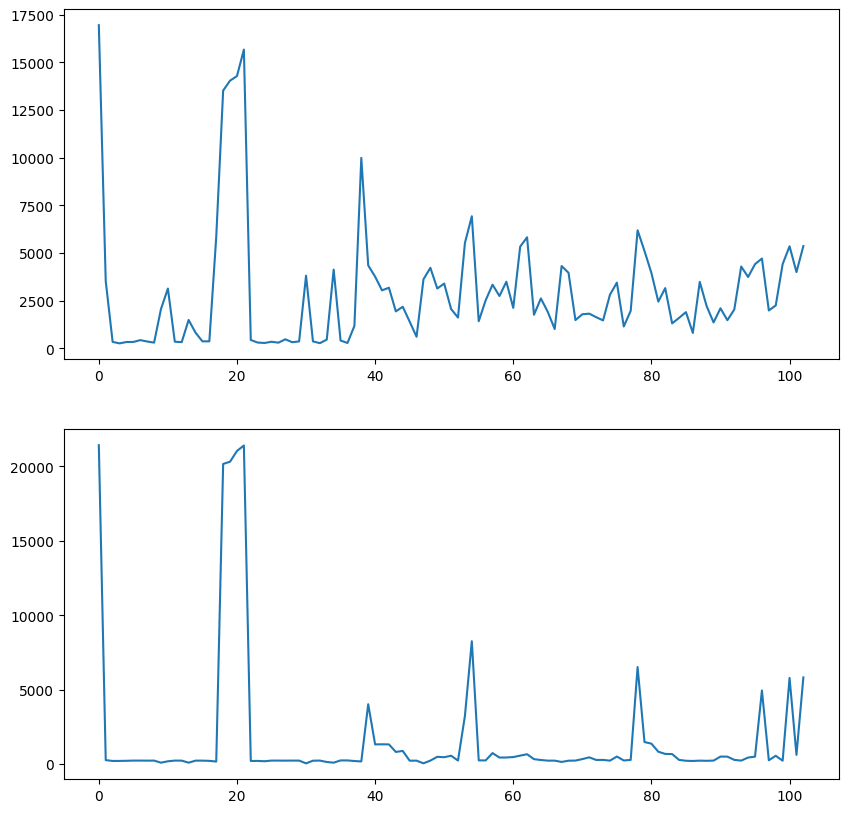

In [87]:
w = Windowing(type='hann')
spectrum = Spectrum()
centroid = Centroid(range=22050)
rolloff = RollOff()

pool = essentia.Pool()

frameSize = 4096 * 3
hopSize = 2048 * 3

pool.clear()

for frame in FrameGenerator(audio, frameSize=frameSize, hopSize=hopSize, startFromZero=False):  
    pool.add('centroid', centroid(spectrum(w(frame))))
    pool.add('rolloff', rolloff(spectrum(w(frame))))
        
cent_lib = librosa.feature.spectral_centroid(y=audio, n_fft=frameSize, hop_length=hopSize, sr=sr)

fig, ax = plt.subplots(2, 1, figsize=(10, 10))
ax[0].plot(pool['centroid'].T)
ax[1].plot(pool['rolloff'].T)

#ax[1].plot(cent_lib.flatten())
plt.show()


In [88]:
aggrpool = PoolAggregator(defaultStats = [ 'mean', 'stdev' ])(pool)

YamlOutput(filename = '../AudioFiles/' + 'features.yaml')(aggrpool)

### Essentia Extractors

- Extractor: alle low/mid/high level 
- MusicExtractor: https://acousticbrainz.org/
- FreesoundExtractor: https://freesound.org/
- LowLevelSpectralEqloudExtractor: Spectral Features für die Equal Loudness nötig ist
- LowLevelSpectralExtractor: Spectral Features, für die keine Equal Loudness nötig ist

In [27]:
# Music Extractor

pool = essentia.Pool()

a = Extractor()(audio)

aggrpool = PoolAggregator(defaultStats = ['mean'])(a) # 'stdev', 'min', 'max', 'median'
YamlOutput(filename = '../AudioFiles/' + 'features.yaml')(aggrpool)

In [ ]:
# pool 
print(pool.descriptorNames())
pool.clear()
help(Extractor)

In [109]:
features, features_frames = MusicExtractor(lowlevelStats=["mean"], rhythmStats=["mean"], tonalStats=["mean"])(file)

[   INFO   ] MusicExtractor: Read metadata
[   INFO   ] MusicExtractor: Compute md5 audio hash, codec, length, and EBU 128 loudness
[   INFO   ] MusicExtractor: Replay gain
[   INFO   ] MusicExtractor: Compute audio features
[   INFO   ] MusicExtractor: Compute aggregation
[   INFO   ] All done


### ML Models

- Audio Event Recognition
- Music Style Classification
- Music Auto Tagging
- Transfer learning Classifiers
- Feature Extractors
- Pitch Detection
- Source Seperation
- Tempo Estimation

In [5]:
from essentia.standard import TensorflowPredictMusiCNN

file = '../AudioFiles/2.mp3'
model = '../Models/msd-musicnn-1.pb'

audio = MonoLoader(filename=file, sampleRate=16000)()
model = TensorflowPredictMusiCNN(graphFilename=model)
activations = model(audio)

[   INFO   ] TensorflowPredict: Successfully loaded graph file: `../Models/msd-musicnn-1.pb`


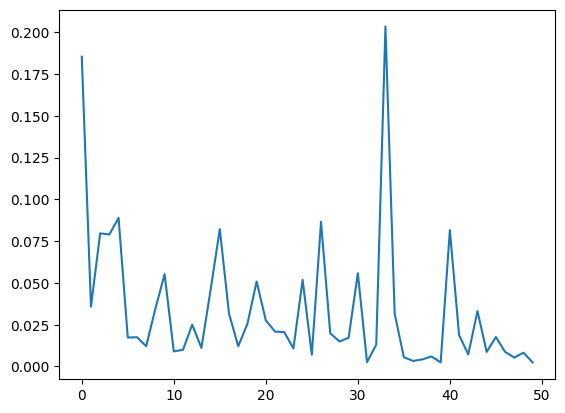

In [7]:
plot(activations[0])

In [31]:
modelPath = '../Models/gender-musicnn-msd-2.pb'

audio = MonoLoader(filename=file, sampleRate=16000)()
model = TensorflowPredictMusiCNN(graphFilename=modelPath)
activations = model(audio)

[   INFO   ] TensorflowPredict: Successfully loaded graph file: `../Models/gender-musicnn-msd-2.pb`


In [42]:
a = np.array(activations.T[0])
a.mean()

0.65318066

In [44]:
modelPath = '../Models/danceability-musicnn-mtt-2.pb'

audio = MonoLoader(filename=file, sampleRate=16000)()
model = TensorflowPredictMusiCNN(graphFilename=modelPath)
activations = model(audio)

[   INFO   ] TensorflowPredict: Successfully loaded graph file: `../Models/danceability-musicnn-mtt-2.pb`


0.780903

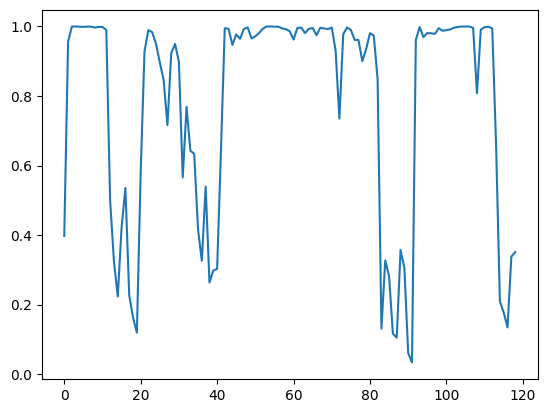

In [47]:
plot(activations.T[0])

activations.T[0].mean()

In [13]:
from essentia.standard import MonoLoader, TensorflowPredictVGGish

modelPath = '../Models/genre_rosamerica-vggish-audioset-1.pb'
file = '../AudioFiles/2.mp3'

audio = MonoLoader(filename=file , sampleRate=16000)()
model = TensorflowPredictVGGish(graphFilename=modelPath)
activations = model(audio)

[   INFO   ] TensorflowPredict: Successfully loaded graph file: `../Models/genre_rosamerica-vggish-audioset-1.pb`


In [34]:
from essentia.standard import MonoLoader, PitchCREPE

audio = MonoLoader(filename=file, sampleRate=16000)()
model = PitchCREPE(graphFilename="../Models/crepe-full-1.pb")
time, frequency, confidence, activations = model(audio)

[   INFO   ] TensorflowPredict: Successfully loaded graph file: `../Models/crepe-full-1.pb`
[   INFO   ] FrameCutter: dropping incomplete frame


#### Weitere Libraries

- https://www.audeering.com/research/opensmile/#ad-opensmile-features
- https://madmom.readthedocs.io/en/latest/
- https://aubio.org/

#### Datasets

- https://ismir.net/resources/datasets/

#### Tools

- https://ismir.net/resources/software-tools/

#### Data Augmentation

- https://pytorch.org/audio/stable/tutorials/audio_data_augmentation_tutorial.html
- https://pypi.org/project/torchaudio-augmentations/

In [110]:
def add_to_dict(dict, keys, value):
    for key in keys[:-1]:
        dict = dict.setdefault(key, {})
    dict[keys[-1]] = value

def pool_to_dict(pool):

    descs = pool.descriptorNames()

    result = {}

    for d in descs:
        keys = d.split('.')
        value = pool[d]
        if type(value) is np.ndarray:
            value = value.tolist()
        add_to_dict(result, keys, value)
    return result

a = pool_to_dict(features)